# Explainable AI (XAI) Tutorial: From Theory to Practice

## Table of Contents
1. Introduction to XAI
2. Setting Up the Environment
3. XAI Tools and Frameworks
4. Implementing XAI for Cloud AI Services
5. XAI for Open Source Models
6. Adversarial Perturbations and Robustness Analysis
7. Conclusion and Further Resources
   

## 1. Introduction to XAI

Explainable AI (XAI) refers to methods and techniques in the application of artificial intelligence technology (AI) such that the results of the solution can be understood by human experts. It contrasts with the concept of the "black box" in machine learning where even their designers cannot explain why the AI arrived at a specific decision.

XAI is crucial for:
- Building trust in AI systems
- Ensuring transparency and accountability
- Debugging and improving AI models
- Complying with regulations

Current challenges in XAI include:
- Balancing model performance with explainability
- Developing XAI techniques for complex models like deep neural networks
- Ensuring XAI methods themselves are robust and reliable
- Making XAI outputs interpretable for non-technical stakeholders

## 2. Setting Up the Environment

Let's start by installing and importing the necessary libraries.

In [2]:
!pip install shap lime tensorflow keras scikit-learn matplotlib cleverhans transformers torch

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
import shap
import lime
from sklearn.model_selection import train_test_split
from sklearn.datasets import load_breast_cancer

print("Libraries imported successfully!")

/tmp/ipykernel_42530/220733472.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd
2024-10-01 17:20:44.421792: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:479] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-10-01 17:20:44.439051: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:10575] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-10-01 17:20:44.439077: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1442] Unable 

Libraries imported successfully!


## 3. XAI Tools and Frameworks

We'll focus on two popular XAI frameworks: SHAP (SHapley Additive exPlanations) and LIME (Local Interpretable Model-agnostic Explanations).

First, let's create a simple model and train it on the breast cancer dataset.

In [4]:
def create_simple_model(input_shape):
    model = keras.Sequential([
        keras.layers.Dense(64, activation='relu', input_shape=input_shape),
        keras.layers.Dense(32, activation='relu'),
        keras.layers.Dense(1, activation='sigmoid')
    ])
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Load and prepare the dataset
data = load_breast_cancer()
X, y = data.data, data.target
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and train the model
model = create_simple_model((X_train.shape[1],))
history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2, verbose=1)

# Evaluate the model
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f"Test accuracy: {test_accuracy:.4f}")

Epoch 1/10


Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
2024-10-01 17:20:47.091026: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-10-01 17:20:47.092570: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-10-01 17:20:47.092779: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), b

 1/12 ━━━━━━━━━━━━━━━━━━━━ 13s 1s/step - accuracy: 0.6875 - loss: 40.8925

I0000 00:00:1727817648.644340   42979 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


12/12 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - accuracy: 0.5908 - loss: 31.2421 - val_accuracy: 0.3626 - val_loss: 15.4909
Epoch 2/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4490 - loss: 9.9526 - val_accuracy: 0.7802 - val_loss: 1.5392
Epoch 3/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6749 - loss: 1.4331 - val_accuracy: 0.7692 - val_loss: 1.8668
Epoch 4/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8128 - loss: 0.9791 - val_accuracy: 0.8791 - val_loss: 0.7532
Epoch 5/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9075 - loss: 0.5430 - val_accuracy: 0.6484 - val_loss: 1.1873
Epoch 6/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7525 - loss: 0.9237 - val_accuracy: 0.8791 - val_loss: 0.5595
Epoch 7/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8802 - loss: 0.3636 - val_accuracy: 0.9121 - val_loss: 0.5518
Epoch 8/10
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8879 - loss: 0.4121 - val_accuracy: 0.8901 - val_loss: 0.5728


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Using 455 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/5 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
29974/29974 ━━━━━━━━━━━━━━━━━━━━ 18s 604us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
29974/29974 ━━━━━━━━━━━━━━━━━━━━ 18s 611us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
29974/29974 ━━━━━━━━━━━━━━━━━━━━ 18s 601us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
29974/29974 ━━━━━━━━━━━━━━━━━━━━ 18s 602us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
29974/29974 ━━━━━━━━━━━━━━━━━━━━ 18s 604us/step


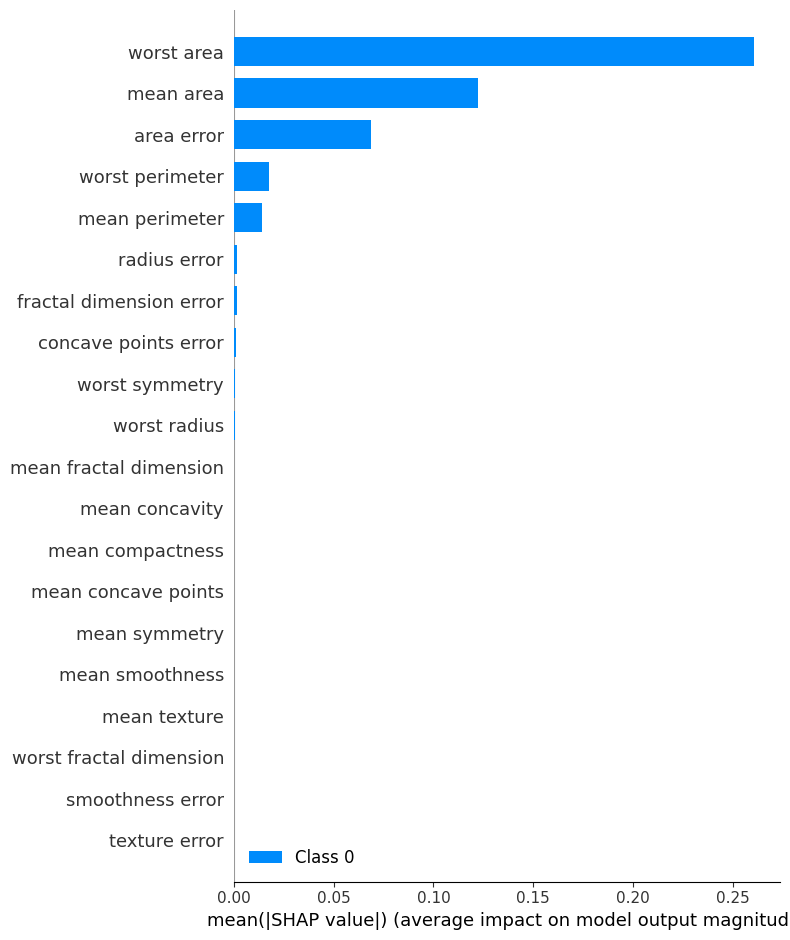

In [5]:
# SHAP example

explainer = shap.KernelExplainer(model.predict, X_train)
shap_values = explainer.shap_values(X_test[:5])
shap.summary_plot(shap_values, X_test[:5], feature_names=data.feature_names)

In [8]:
# LIME example
from lime import lime_tabular

# Wrapper function to ensure the model returns probabilities for both classes
def predict_proba(X):
    preds = model.predict(X)
    return np.column_stack((1 - preds, preds))

explainer = lime_tabular.LimeTabularExplainer(
    X_train, 
    feature_names=data.feature_names, 
    class_names=['malignant', 'benign'], 
    mode='classification'
)
exp = explainer.explain_instance(X_test[0], predict_proba, num_features=10)
exp.show_in_notebook()

157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 755us/step


## 3.2. XAI with COMPAS Dataset: Exploring Algorithmic Fairness

In [11]:
!pip install pandas scikit-learn shap

In [12]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
import shap

# Load COMPAS dataset
url = "https://raw.githubusercontent.com/propublica/compas-analysis/master/compas-scores-two-years.csv"
df = pd.read_csv(url)

# Preprocess the data
df = df[(df.days_b_screening_arrest <= 30) & 
        (df.days_b_screening_arrest >= -30) &
        (df.is_recid != -1) &
        (df.c_charge_degree != 'O') &
        (df.score_text != 'N/A')]

# Select features and target
features = ['age', 'c_charge_degree', 'race', 'sex', 'priors_count', 'days_b_screening_arrest']
target = 'is_recid'

# Encode categorical variables
df_encoded = pd.get_dummies(df[features + [target]], columns=['c_charge_degree', 'race', 'sex'])

# Split the data
X = df_encoded.drop(columns=[target])
y = df_encoded[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a Random Forest model
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Evaluate the model
print(f"Model accuracy: {model.score(X_test, y_test):.4f}")



Model accuracy: 0.6178


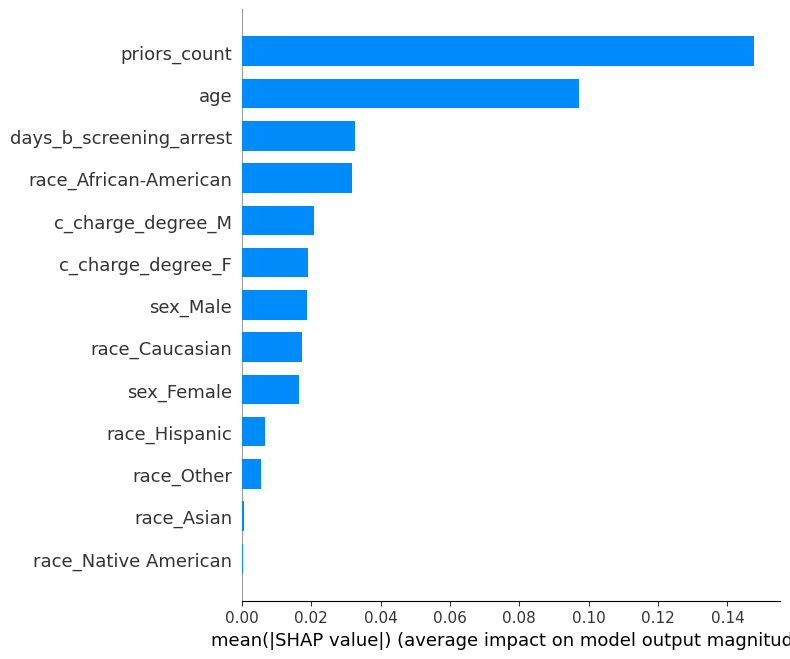

In [13]:
# SHAP analysis
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test)

# Plot SHAP summary
shap.summary_plot(shap_values[1], X_test, plot_type="bar")


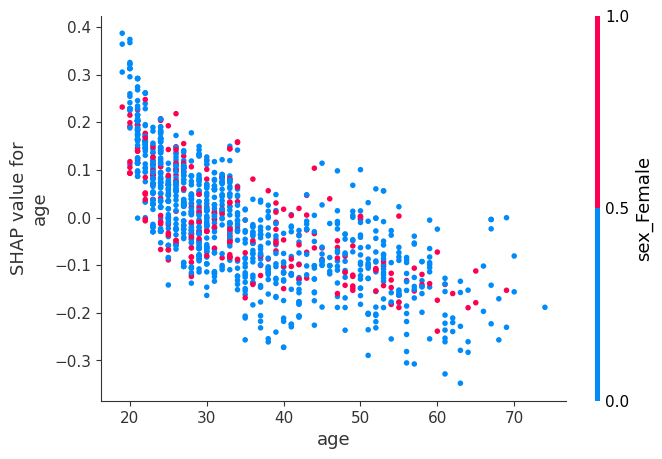

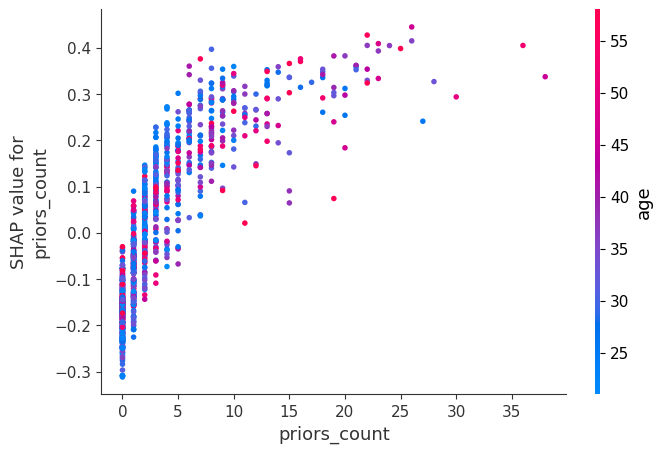

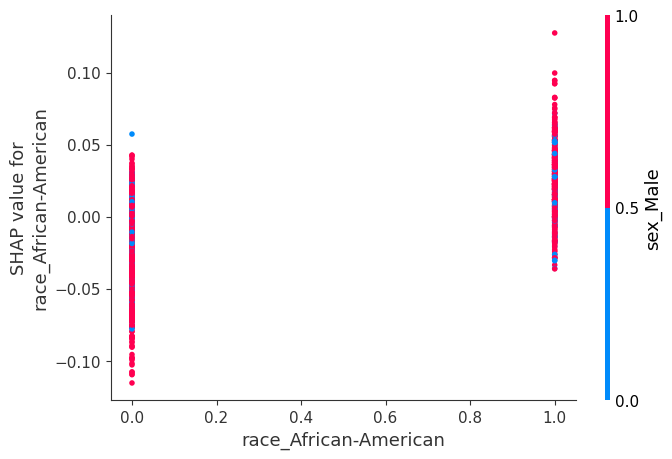

In [15]:

# Plot SHAP dependence plots for key features
shap.dependence_plot("age", shap_values[1], X_test)
shap.dependence_plot("priors_count", shap_values[1], X_test)
shap.dependence_plot("race_African-American", shap_values[1], X_test)



In [16]:
# Analyze fairness
def fairness_analysis(model, X, sensitive_feature):
    predictions = model.predict(X)
    feature_values = X[sensitive_feature]
    unique_values = feature_values.unique()
    
    for value in unique_values:
        subset = X[feature_values == value]
        subset_preds = model.predict(subset)
        print(f"{sensitive_feature} = {value}:")
        print(f"  Positive prediction rate: {subset_preds.mean():.4f}")
        print(f"  Sample size: {len(subset)}")
    
    print("\nOverall positive prediction rate:", predictions.mean())

print("Fairness analysis for race:")
fairness_analysis(model, X_test, "race_African-American")
print("\nFairness analysis for sex:")
fairness_analysis(model, X_test, "sex_Female")


Fairness analysis for race:
race_African-American = True:
  Positive prediction rate: 0.5993
  Sample size: 614
race_African-American = False:
  Positive prediction rate: 0.3527
  Sample size: 621

Overall positive prediction rate: 0.47530364372469636

Fairness analysis for sex:
sex_Female = False:
  Positive prediction rate: 0.5171
  Sample size: 992
sex_Female = True:
  Positive prediction rate: 0.3045
  Sample size: 243

Overall positive prediction rate: 0.47530364372469636


## 4. Implementing XAI for Cloud AI Services

For this section, we would typically demonstrate how to use XAI techniques with cloud-based AI services, such as those provided by Azure. However, as this requires specific setup and credentials, we'll provide a conceptual overview instead.

Steps to implement XAI for cloud AI services:
1. Set up cloud credentials and access
2. Use the cloud provider's SDK to access the AI model
3. Get predictions from the cloud model
4. Apply XAI techniques (like SHAP or LIME) to these predictions
5. Visualize and interpret the results



## 5. XAI for Open Source Models

Let's demonstrate XAI techniques on a pre-trained Vision Transformer (ViT) model.

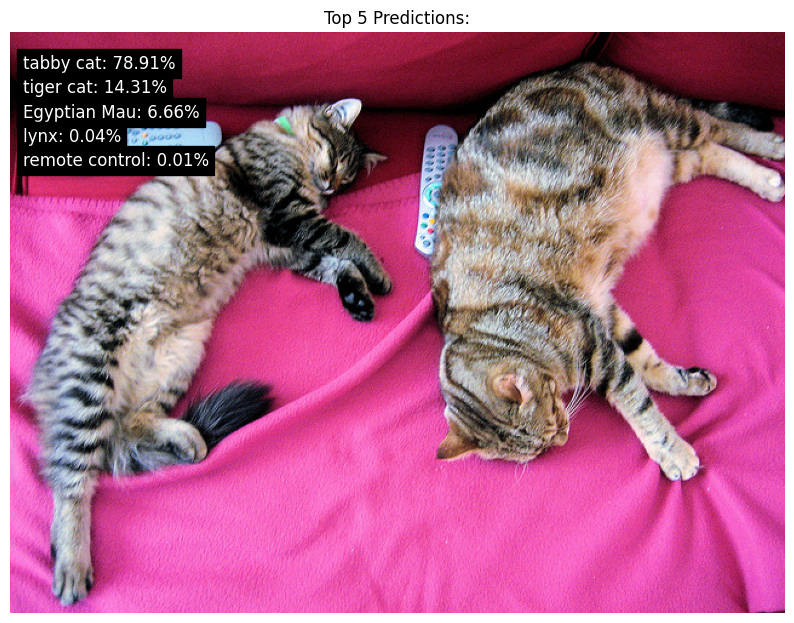

Top 5 predictions:
tabby cat: 78.91%
tiger cat: 14.31%
Egyptian Mau: 6.66%
lynx: 0.04%
remote control: 0.01%


In [32]:
import torch
from torchvision import models, transforms
from PIL import Image
import requests
import matplotlib.pyplot as plt

# Load pre-trained ResNet50 model
model = models.resnet50(pretrained=True)
model.eval()

# Define image preprocessing
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Load and process an image (cat image)
url = "http://images.cocodataset.org/val2017/000000039769.jpg"
image = Image.open(requests.get(url, stream=True).raw)
input_tensor = preprocess(image)
input_batch = input_tensor.unsqueeze(0)

# Get model prediction
with torch.no_grad():
    output = model(input_batch)

# Load ImageNet class labels
import json
import urllib.request

url = "https://raw.githubusercontent.com/anishathalye/imagenet-simple-labels/master/imagenet-simple-labels.json"
with urllib.request.urlopen(url) as response:
    labels = json.loads(response.read())

# Get top 5 predictions
probabilities = torch.nn.functional.softmax(output[0], dim=0)
top5_prob, top5_catid = torch.topk(probabilities, 5)

# Display the image and predictions
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis('off')
plt.title("Top 5 Predictions:")
for i in range(5):
    plt.text(10, 30 + i * 20, f"{labels[top5_catid[i]]}: {top5_prob[i]:.2%}", 
             fontsize=12, color='white', backgroundcolor='black')
plt.show()

# Print top 5 predictions
print("Top 5 predictions:")
for i in range(5):
    print(f"{labels[top5_catid[i]]}: {top5_prob[i]:.2%}")

For image models, we can use techniques like Grad-CAM for visual explanations. Here's a simple implementation:

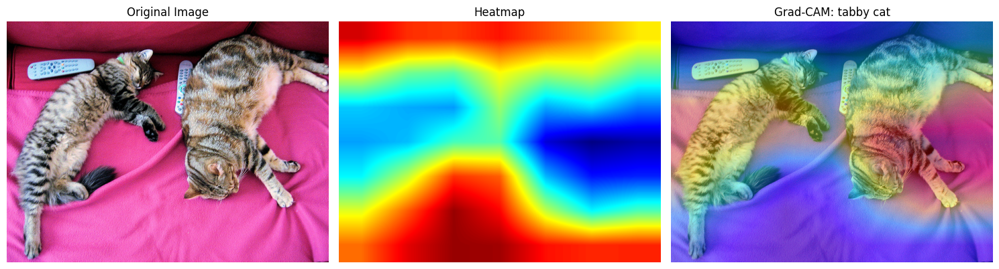

Predicted class: tabby cat


In [34]:
import numpy as np
import cv2

def grad_cam(model, input_tensor, target_layer):
    # Hook the specified layer
    activations = None
    gradients = None
    
    def forward_hook(module, input, output):
        nonlocal activations
        activations = output
    
    def backward_hook(module, grad_input, grad_output):
        nonlocal gradients
        gradients = grad_output[0]
    
    handle1 = target_layer.register_forward_hook(forward_hook)
    handle2 = target_layer.register_backward_hook(backward_hook)
    
    # Forward pass
    model.zero_grad()
    output = model(input_tensor)
    
    # Backward pass
    pred_class = output.argmax().item()
    output[:, pred_class].backward()
    
    # Remove hooks
    handle1.remove()
    handle2.remove()
    
    # Compute Grad-CAM
    pooled_gradients = torch.mean(gradients, dim=[0, 2, 3])
    for i in range(activations.size(1)):
        activations[:, i, :, :] *= pooled_gradients[i]
    
    heatmap = torch.mean(activations, dim=1).squeeze().detach().numpy()
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)
    
    return heatmap, pred_class

# Generate Grad-CAM
target_layer = model.layer4[-1]
heatmap, pred_class = grad_cam(model, input_batch, target_layer)

# Resize heatmap to match image size
heatmap = cv2.resize(heatmap, (image.size[0], image.size[1]))

# Enhance contrast of the heatmap
heatmap = np.uint8(255 * heatmap)
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

# Convert PIL Image to numpy array
img_np = np.array(image)

# Superimpose heatmap on original image
superimposed_img = cv2.addWeighted(img_np, 0.6, heatmap, 0.4, 0)

# Display the Grad-CAM result
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(image)
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(heatmap)
plt.title("Heatmap")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))
plt.title(f"Grad-CAM: {labels[pred_class]}")
plt.axis('off')

plt.tight_layout()
plt.show()

# Print prediction
print(f"Predicted class: {labels[pred_class]}")

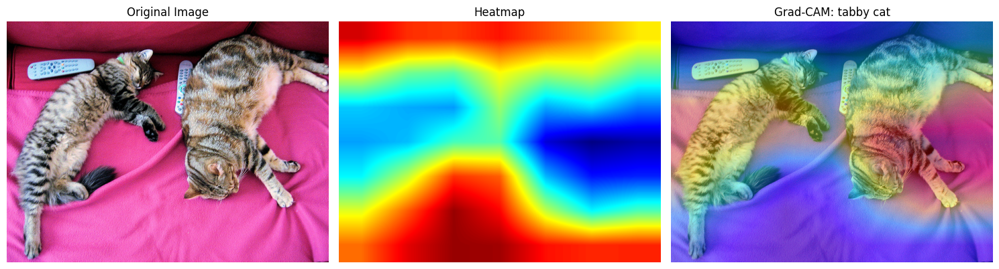

Predicted class: tabby cat


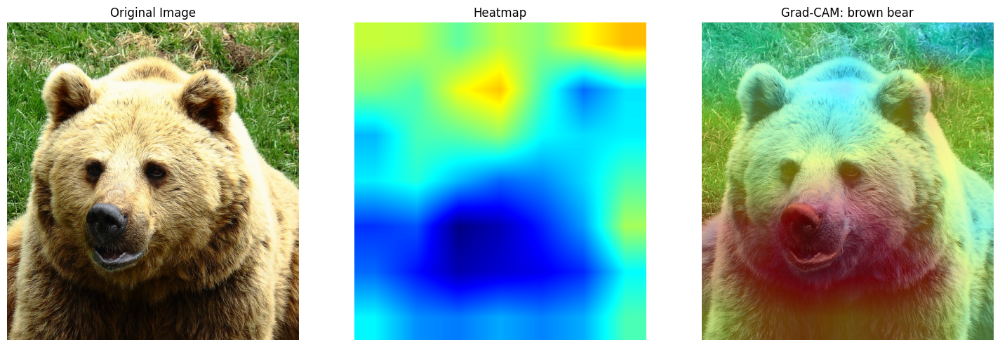

Predicted class: brown bear


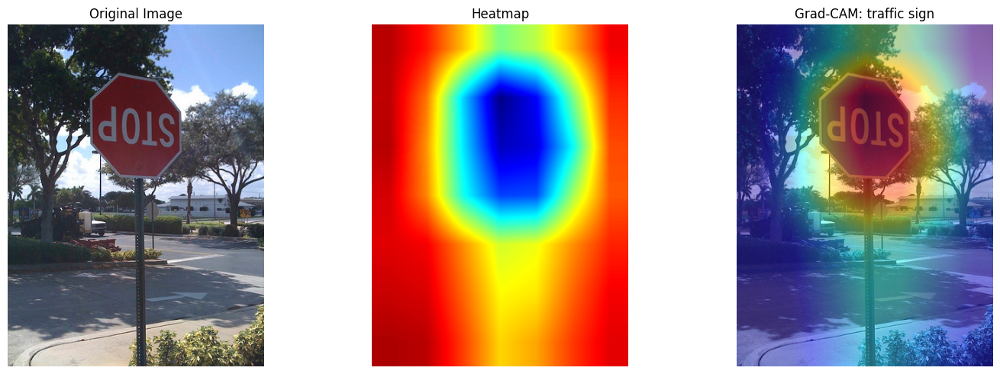

Predicted class: traffic sign


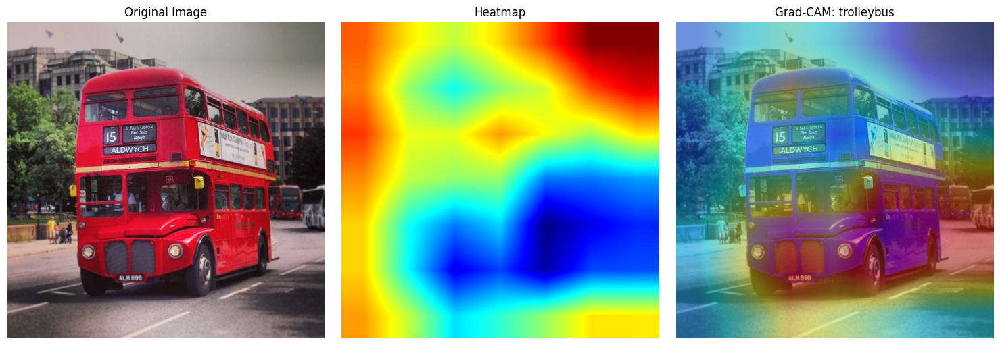

Predicted class: trolleybus


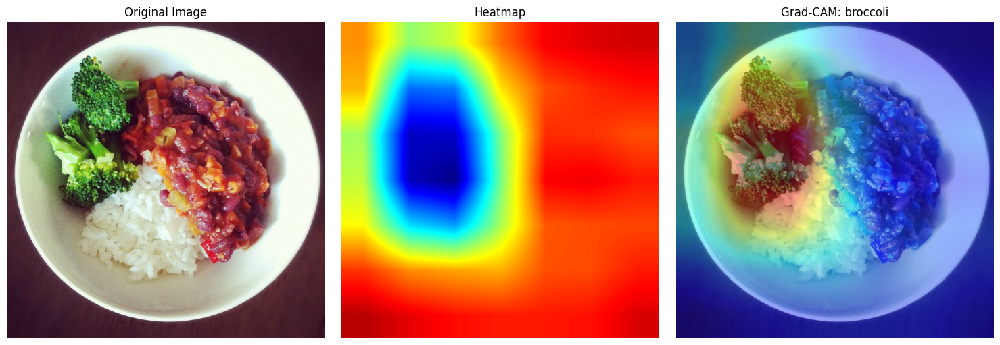

Predicted class: broccoli
Error processing image from https://upload.wikimedia.org/wikipedia/commons/d/d1/Pepperoni_pizza.jpg: 403 Client Error: Forbidden. Please comply with the User-Agent policy: https://meta.wikimedia.org/wiki/User-Agent_policy for url: https://upload.wikimedia.org/wikipedia/commons/d/d1/Pepperoni_pizza.jpg
Error processing image from https://upload.wikimedia.org/wikipedia/commons/d/d3/Locomotive_TEM2-029.jpg: 403 Client Error: Forbidden. Please comply with the User-Agent policy: https://meta.wikimedia.org/wiki/User-Agent_policy for url: https://upload.wikimedia.org/wikipedia/commons/d/d3/Locomotive_TEM2-029.jpg
Error processing image from https://upload.wikimedia.org/wikipedia/commons/4/45/Eopsaltria_australis_-_Mogo_Campground.jpg: 403 Client Error: Forbidden. Please comply with the User-Agent policy: https://meta.wikimedia.org/wiki/User-Agent_policy for url: https://upload.wikimedia.org/wikipedia/commons/4/45/Eopsaltria_australis_-_Mogo_Campground.jpg
Error proce

In [43]:
import requests
from PIL import Image
import numpy as np
import cv2
import matplotlib.pyplot as plt

def process_and_visualize(image_url, model, preprocess, labels):
    try:
        # Load and process the image
        response = requests.get(image_url, stream=True)
        response.raise_for_status()
        image = Image.open(response.raw)
        
        input_tensor = preprocess(image)
        input_batch = input_tensor.unsqueeze(0)

        # Generate Grad-CAM
        target_layer = model.layer4[-1]
        heatmap, pred_class = grad_cam(model, input_batch, target_layer)

        # Resize heatmap to match image size
        heatmap = cv2.resize(heatmap, (image.size[0], image.size[1]))

        # Enhance contrast of the heatmap
        heatmap = np.uint8(255 * heatmap)
        heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

        # Convert PIL Image to numpy array
        img_np = np.array(image)

        # Superimpose heatmap on original image
        superimposed_img = cv2.addWeighted(img_np, 0.6, heatmap, 0.4, 0)

        # Display results
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 3, 1)
        plt.imshow(image)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(heatmap)
        plt.title("Heatmap")
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))
        plt.title(f"Grad-CAM: {labels[pred_class]}")
        plt.axis('off')

        plt.tight_layout()
        plt.show()

        print(f"Predicted class: {labels[pred_class]}")
    
    except Exception as e:
        print(f"Error processing image from {image_url}: {str(e)}")

# Updated image examples (10 images)
image_urls = [
    "http://images.cocodataset.org/val2017/000000039769.jpg",  
    "http://images.cocodataset.org/val2017/000000000285.jpg",  
    "http://images.cocodataset.org/val2017/000000000724.jpg", 
    "http://images.cocodataset.org/val2017/000000001584.jpg",  
    "http://images.cocodataset.org/val2017/000000003501.jpg",  

]

for url in image_urls:
    process_and_visualize(url, model, preprocess, labels)

## 6. ResNet with Grad-CAM Example

In [ ]:
# Install required libraries
!pip install torch torchvision opencv-python

In [ ]:


import torch
import torchvision
from torchvision import transforms
from PIL import Image
import requests
import matplotlib.pyplot as plt
import numpy as np
import cv2

# Load pre-trained ResNet model
model = torchvision.models.resnet50(pretrained=True)
model.eval()

# Image preprocessing
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Load and preprocess the image
url = "http://images.cocodataset.org/val2017/000000039769.jpg"
image = Image.open(requests.get(url, stream=True).raw)
input_tensor = preprocess(image)
input_batch = input_tensor.unsqueeze(0)

# Make a prediction
with torch.no_grad():
    output = model(input_batch)

# Get the predicted class
_, predicted_idx = torch.max(output, 1)
predicted_label = predicted_idx.item()

# Print the predicted class
print(f"Predicted class: {predicted_label}")

# Display the original image
plt.imshow(image)
plt.axis('off')
plt.show()

SyntaxError: invalid syntax (2382307748.py, line 4)

## 7. Conclusion and Further Resources

In this tutorial, we've explored various aspects of Explainable AI (XAI):

1. We introduced the concept of XAI and its importance in modern AI systems.
2. We demonstrated the use of popular XAI frameworks like SHAP and LIME.
3. We discussed how to implement XAI for cloud-based AI services.
4. We applied XAI techniques to open-source models, including vision models like ViT.
5. We explored the impact of adversarial perturbations and how XAI can help understand these effects.

Key takeaways:
- XAI is crucial for building trust, ensuring transparency, and improving AI systems.
- Different XAI techniques are suitable for different types of models and use cases.
- XAI can provide valuable insights into model behavior, including vulnerabilities to adversarial attacks.

For further exploration, consider the following resources:

1. "Interpretable Machine Learning" by Christoph Molnar: https://christophm.github.io/interpretable-ml-book/
2. SHAP documentation: https://shap.readthedocs.io/
3. LIME GitHub repository: https://github.com/marcotcr/lime


Remember that XAI is an active area of research, and new techniques and best practices are continually emerging. Stay curious and keep exploring!